In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plant-pathology-2020-fgvc7/sample_submission.csv
/kaggle/input/plant-pathology-2020-fgvc7/train.csv
/kaggle/input/plant-pathology-2020-fgvc7/test.csv
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_1743.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_262.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1524.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1336.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1461.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1797.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_1499.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Train_1170.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_1259.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_422.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_636.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_1395.jpg
/kaggle/input/plant-pathology-2020-fgvc7/images/Test_1800.jpg
/kaggle/input/plant-patholog

In [2]:
train=pd.read_csv('/kaggle/input/plant-pathology-2020-fgvc7/train.csv')
test=pd.read_csv('/kaggle/input/plant-pathology-2020-fgvc7/test.csv')

In [3]:
image_path = "/kaggle/input/plant-pathology-2020-fgvc7/images/"

In [4]:
train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [5]:
test.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


cv2.cvtColor() method is used to convert an image from one color space to another

cv2.imread() method loads an image from the specified file

A progress bar in python indicates whether the code is completing its job or is stuck in an infinite loop.(tdqm - used to create a smart progress bar for the loops.)

In [6]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install scikit-image

Note: you may need to restart the kernel to use updated packages.


In [8]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from kaggle_datasets import KaggleDatasets
from tensorflow.keras.applications import DenseNet121

#import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [9]:
from tqdm import tqdm
import cv2
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(image_path + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train["image_id"][:100].progress_apply(load_image)

100%|██████████| 100/100 [00:04<00:00, 24.30it/s]



Plotly express is a high-level data visualization package that allows you to create interactive plots with very little code

In [10]:
import plotly.express as px
fig = px.imshow(cv2.resize(train_images[0], (205, 136)))
fig.show()

# Checking for Distributions Types(Normal or What):

In [11]:
red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

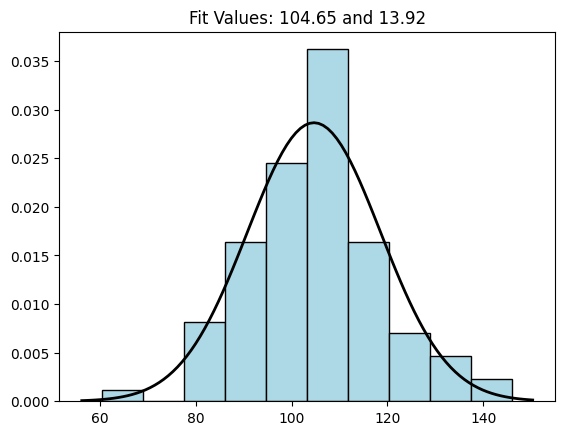

In [12]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
  
data = np.random.normal(170, 10, 250)
  
mu, std = norm.fit(values) 
  
# Plot the histogram.
plt.hist(values,density=True,color='lightblue',edgecolor='black')
  
# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
  
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

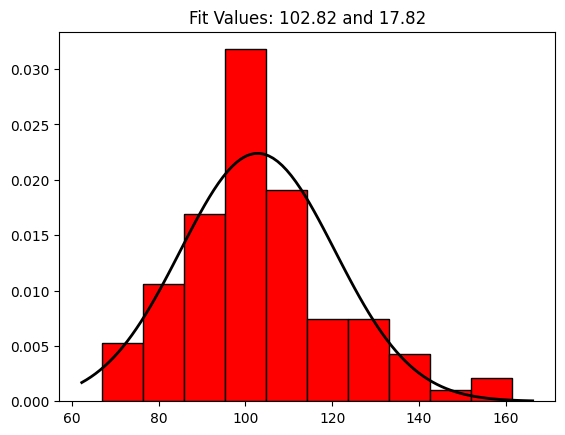

In [13]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
  
data = np.random.normal(170, 10, 250)
  
mu, std = norm.fit(red_values) 
  
# Plot the histogram.
plt.hist(red_values, density=True,color='red',edgecolor='black')
  
# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
  
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

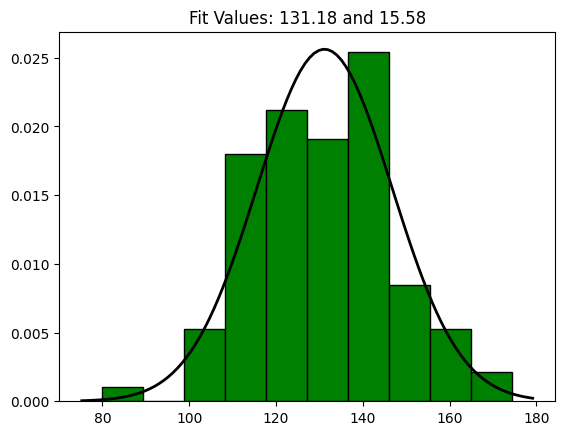

In [14]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
  
data = np.random.normal(170, 10, 250)
  
mu, std = norm.fit(green_values) 
  
# Plot the histogram.
plt.hist(green_values, density=True,color='green',edgecolor='black')
  
# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
  
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

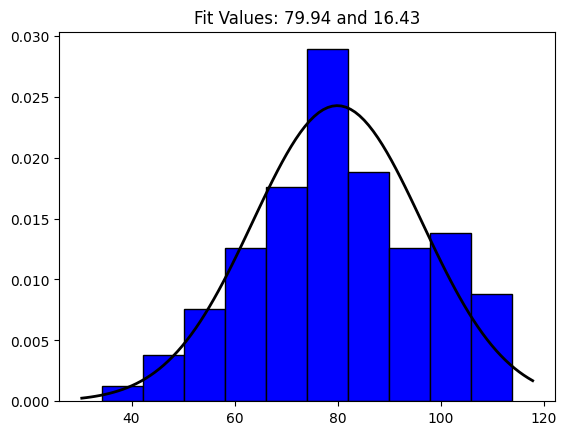

In [15]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
  
data = np.random.normal(170, 10, 250)
  
mu, std = norm.fit(blue_values) 
  
# Plot the histogram.
plt.hist(blue_values, density=True,color='blue',edgecolor='black')
  
# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
  
plt.plot(x, p, 'k', linewidth=2)
title = "Fit Values: {:.2f} and {:.2f}".format(mu, std)
plt.title(title)
  
plt.show()

From the plots we can say that values are normally distributed.

Red_values are a normal distribution but a bit right skewed. 

Green_values are having better distribution than red.

Blue_values are best with almost normal distribution.

The parallel categories diagram (also known as parallel sets or alluvial diagram) is a visualization of multi-dimensional categorical data sets. Each variable in the data set is represented by a column of rectangles, where each rectangle corresponds to a discrete value taken on by that variable. The relative heights of the rectangles reflect the relative frequency of occurrence of the corresponding value.

In [16]:
"""fig = px.parallel_categories(train[["healthy", "scab", "rust", "multiple_diseases"]], color="healthy", color_continuous_scale="sunset",\
                             title="Parallel categories plot of targets")
fig

"""
import plotly.express as px

df = px.data.tips()
fig = px.parallel_categories(train[["healthy", "scab", "rust", "multiple_diseases"]],color="healthy",title="Parallel categories plot of targets")

fig.show()

In the above plot, we can see the relationship between all four categories. As expected, it is impossible for a healthy leaf (healthy == 1) to have scab, rust, or multiple diseases. Also, every unhealthy leaf has one of either scab, rust, or multiple diseases. The frequency of each combination can be seen by hovering over the plot.

In [17]:
fig = go.Figure([go.Pie(labels=train.columns[1:],
           values=train.iloc[:, 1:].sum().values)])
fig.update_layout(title_text="Pie chart of targets", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.show()

In the pie chart above, we can see that most leaves in the dataset are unhealthy (71.7%). Only 5% of plants have multiple diseases, and "rust" and "scab" occupy approximately one-third of the pie each.

# Image Augmentation

For Augmentation let's take a sample image and do the necessary operations

(1365, 2048, 3)


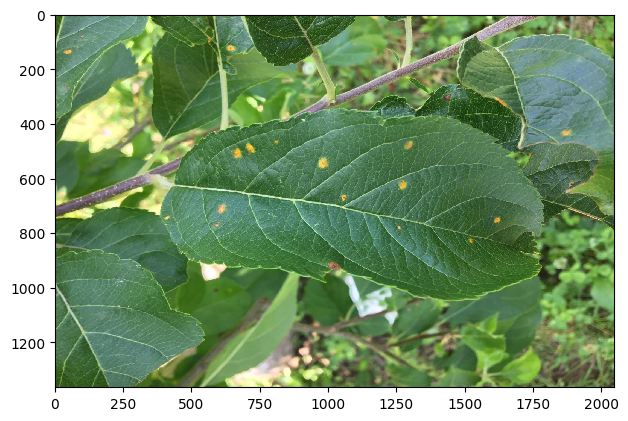

In [18]:
from skimage.io import imshow
image = train_images[15]
imshow(image)
print(image.shape)

### Flipping

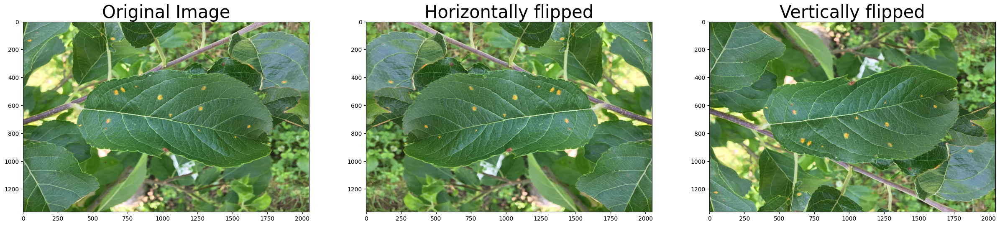

In [19]:
"""hflipped_image= np.fliplr(image) #fliplr reverse the order of columns of pixels in matrix
#Vertically flipped

vflipped_image= np.flipud(image) #flipud reverse the order of rows of pixels in matrix
#horizontal flip"""

vflipped_image = cv2.flip(image, 0)

hflipped_image = cv2.flip(image, 1)


fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(hflipped_image)
ax[1].set_title("Horizontally flipped", size=30)
ax[2].imshow(vflipped_image)
ax[2].set_title("Vertically flipped", size=30);

### Rotation

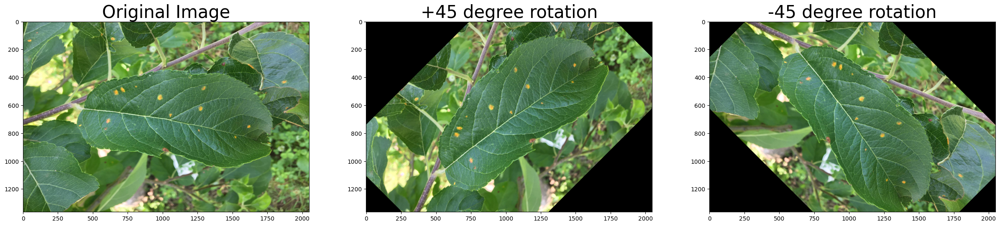

In [20]:
"""rot_clockwise_image = cv2.rotate(image13, cv2.ROTATE_90_CLOCKWISE)
rot_anticlockwise_image = cv2.rotate(image13, cv2.ROTATE_90_COUNTERCLOCKWISE)"""
from skimage.transform import rotate

rot_clockwise_image = rotate(image, angle=45) 
rot_anticlockwise_image = rotate(image, angle=-45)

fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=30)
ax[1].imshow(rot_clockwise_image)
ax[1].set_title("+45 degree rotation", size=30)
ax[2].imshow(rot_anticlockwise_image)
ax[2].set_title("-45 degree rotation", size=30);

### Brightness Manipulation

Text(0.5, 1.0, 'Darkened Image')

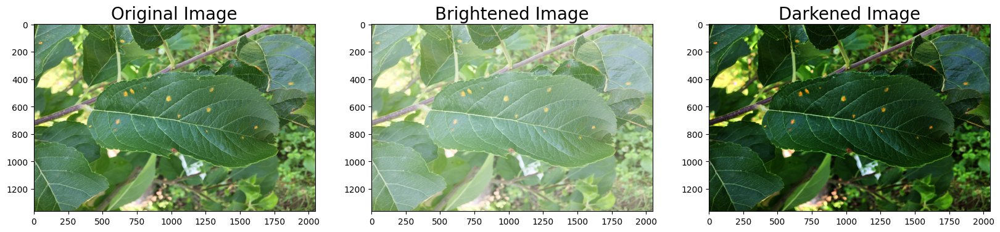

In [21]:
from skimage.exposure import adjust_gamma
image_bright = adjust_gamma(image, gamma=0.5,gain=1)
image_dark = adjust_gamma(image, gamma=2,gain=1)

fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(20,12))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=20)
ax[1].imshow(image_bright)
ax[1].set_title("Brightened Image", size=20)
ax[2].imshow(image_dark)
ax[2].set_title("Darkened Image", size=20)

### Noise Addition

Text(0.5, 1.0, 'Image after adding noise')

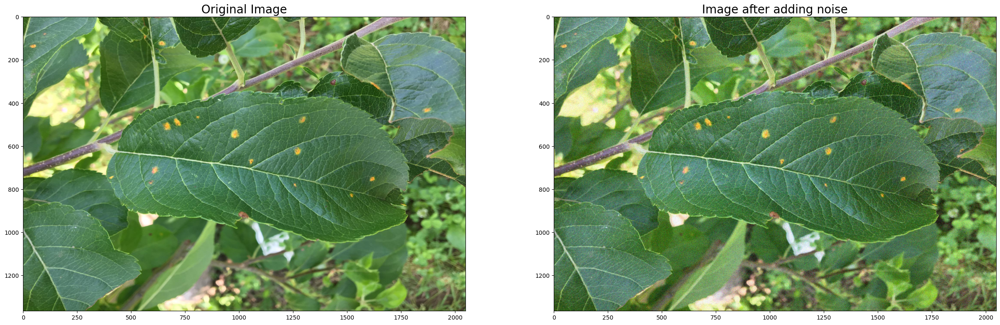

In [22]:
from skimage.util import random_noise
noisy_image= random_noise(image)

fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(30,16))
ax[0].imshow(image)
ax[0].set_title("Original Image", size=20)
ax[1].imshow(noisy_image)
ax[1].set_title("Image after adding noise",size=20)

### Blurring Image

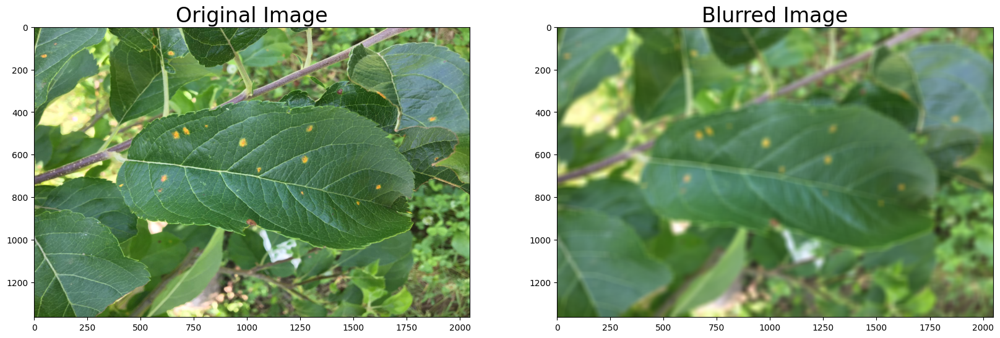

In [23]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
ax[0].imshow(image)
ax[0].set_title('Original Image', fontsize=24)
ax[1].imshow(cv2.blur(image, (30, 30)))
ax[1].set_title('Blurred Image', fontsize=24)

plt.show()

In [24]:
def new_model():
    model=tf.keras.Sequential()
    model.add(Conv2D(32,kernel_size=3,padding='same',input_shape=(img_size,img_size,3),activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(32,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(32,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(32,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(64,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(128,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(256,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Flatten())
    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(4,activation='softmax'))
    
    optimizer = Adam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=0.1, decay=0.0)
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    model.summary()
    return model

In [25]:
GCS_DS_PATH = KaggleDatasets().get_gcs_path()
def format_path(st):
    return GCS_DS_PATH + '/images/' + st + '.jpg'

test_paths = test.image_id.apply(format_path).values
train_paths = train.image_id.apply(format_path).values 

train_labels = np.float32(train.loc[:, 'healthy':'scab'].values)

train_paths, valid_paths, train_labels, valid_labels =train_test_split(train_paths, train_labels, test_size=0.15, random_state=100)

In [26]:
print(train_labels.shape)
print(train_labels.shape)

(1547, 4)
(1547, 4)


In [27]:
def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

In [28]:
def decode_image(filename, label=None, image_size=(512, 512)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    
    if label is None:
        return image
    else:
        return image, label

In [29]:
BATCH_SIZE=32
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image)
    #.map(data_augment)
    .repeat()
    .shuffle(512)
    .batch(BATCH_SIZE)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((valid_paths, valid_labels))
    .map(decode_image)
    .batch(BATCH_SIZE)
    .cache()
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image)
    .batch(BATCH_SIZE)
)

# DenseNet

In [30]:
"""model = tf.keras.Sequential([DenseNet121(input_shape=(512, 512, 3),
                                         weights='imagenet',
                                         include_top=False),
                             L.GlobalAveragePooling2D(),
                             L.Dense(train_labels.shape[1],
                                     activation='softmax')])

model.compile(optimizer='adam',
              loss = 'categorical_crossentropy',
              metrics=['categorical_accuracy'])
model.summary()"""

"model = tf.keras.Sequential([DenseNet121(input_shape=(512, 512, 3),\n                                         weights='imagenet',\n                                         include_top=False),\n                             L.GlobalAveragePooling2D(),\n                             L.Dense(train_labels.shape[1],\n                                     activation='softmax')])\n\nmodel.compile(optimizer='adam',\n              loss = 'categorical_crossentropy',\n              metrics=['categorical_accuracy'])\nmodel.summary()"

In [31]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    print("Name:", gpu.name, "  Type:", gpu.device_type)


Name: /physical_device:GPU:0   Type: GPU


In [32]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 11414770028577826735
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16059727872
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 5023886834863242486
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
 xla_global_id: 416903419]

In [33]:

tf.test.is_gpu_available()

True

In [34]:
import tensorflow as tf

device_name = tf.test.gpu_device_name()

if "GPU" not in device_name:
    print("GPU device not found")
    
print('Found GPU at: {}'.format(device_name))

print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

Found GPU at: /device:GPU:0
GPU available (YESS!!!!)


In [35]:
"""from IPython.display import SVG
SVG(tf.keras.utils.model_to_dot(Model(model.layers[0].input, model.layers[0].layers[13].output), dpi=60).create(prog='dot', format='svg'))"""

"from IPython.display import SVG\nSVG(tf.keras.utils.model_to_dot(Model(model.layers[0].input, model.layers[0].layers[13].output), dpi=60).create(prog='dot', format='svg'))"

### Visualize model architecture

The model consists of the DenseNet head (without the top), followed by global average pooling and a dense layer (with softmax) to generate probabilities.

In [36]:
"""SVG(tf.keras.utils.model_to_dot(model, dpi=70).create(prog='dot', format='svg'))"""

"SVG(tf.keras.utils.model_to_dot(model, dpi=70).create(prog='dot', format='svg'))"

The below code is taking too long to train we need a better system.

In [37]:
"""STEPS_PER_EPOCH=train_labels.shape[0]//BATCH_SIZE
history = model.fit(train_dataset,
                    epochs=20,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)"""

'STEPS_PER_EPOCH=train_labels.shape[0]//BATCH_SIZE\nhistory = model.fit(train_dataset,\n                    epochs=20,\n                    steps_per_epoch=STEPS_PER_EPOCH,\n                    validation_data=valid_dataset)'

Let's make our own model

In [38]:
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Flatten,MaxPool2D,Dropout,BatchNormalization,Activation
from keras.optimizers import Adam

In [39]:
def new_model():
    model=tf.keras.Sequential()
    model.add(Conv2D(32,kernel_size=3,padding='same',input_shape=(img_size,img_size,3),activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(32,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(32,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(32,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(64,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(64,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(128,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(128,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(Conv2D(256,kernel_size=3,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2,2)))
    model.add(Conv2D(256,kernel_size=5,padding='same',activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    
    model.add(Flatten())
    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(4,activation='softmax'))
    
    optimizer = Adam(lr=0.002, beta_1=0.9, beta_2=0.999, epsilon=0.1, decay=0.0)
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    model.summary()
    return model

In [40]:
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
annealer = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=5, verbose=1, min_lr=1e-3)
checkpoint = ModelCheckpoint('model.h5', verbose=1, save_best_only=True)

In [41]:
img_size=512
model=new_model()
history2 = model.fit(train_dataset,
               steps_per_epoch=train_paths.shape[0] // 32,
               epochs=25,
               verbose=1,
               callbacks=[annealer, checkpoint],
                validation_data=valid_dataset
               )

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 512, 512, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 512, 512, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 512, 512, 32)      9248      
                                                                 
 conv2d_2 (Conv2D)           (None, 512, 512, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 512, 512, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 256, 256, 32)     0

/opt/conda/lib/python3.10/site-packages/keras/optimizers/legacy/adam.py:117: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.

2023-10-15 18:57:17.738455: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


48/48 [==============================] - ETA: 0s - loss: 1.4386 - accuracy: 0.3633
Epoch 1: val_loss improved from inf to 1.41673, saving model to model.h5
48/48 [==============================] - 475s 7s/step - loss: 1.4386 - accuracy: 0.3633 - val_loss: 1.4167 - val_accuracy: 0.3321 - lr: 0.0020
Epoch 2/25
48/48 [==============================] - ETA: 0s - loss: 1.2231 - accuracy: 0.4486
Epoch 2: val_loss did not improve from 1.41673
48/48 [==============================] - 284s 6s/step - loss: 1.2231 - accuracy: 0.4486 - val_loss: 1.5507 - val_accuracy: 0.3321 - lr: 0.0020
Epoch 3/25
48/48 [==============================] - ETA: 0s - loss: 1.1928 - accuracy: 0.4655
Epoch 3: val_loss did not improve from 1.41673
48/48 [==============================] - 253s 5s/step - loss: 1.1928 - accuracy: 0.4655 - val_loss: 1.7210 - val_accuracy: 0.3321 - lr: 0.0020
Epoch 4/25
48/48 [==============================] - ETA: 0s - loss: 1.1569 - accuracy: 0.4733
Epoch 4: val_loss did not improve from 

In [42]:
# predict = model.predict(test_dataset)
# all_predict = np.ndarray(shape = (test.shape[0],4),dtype = np.float32)
# for i in range(0,test.shape[0]):
#     for j in range(0,4):
#         if predict[i][j]==max(predict[i]):
#             all_predict[i][j] = 1
#         else:
#             all_predict[i][j] = 0 

# Inception NET

Taking a lot of time and issue with memory.

In [43]:
"""from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau"""

'from tensorflow.keras.applications import InceptionResNetV2\nfrom tensorflow.keras.models import Model\nfrom tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D\n\nfrom tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau'

In [44]:
"""net = InceptionResNetV2(weights= 'imagenet', include_top=False, input_shape= (299,299,3))
x = net.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(64, activation="relu")(x)
x = Dense(32, activation="relu")(x)
predictions = Dense(4, activation= 'softmax')(x)
model = Model(inputs = net.input, outputs = predictions)"""

'net = InceptionResNetV2(weights= \'imagenet\', include_top=False, input_shape= (299,299,3))\nx = net.output\nx = GlobalAveragePooling2D()(x)\nx = Dense(128, activation="relu")(x)\nx = Dropout(0.5)(x)\nx = Dense(64, activation="relu")(x)\nx = Dense(32, activation="relu")(x)\npredictions = Dense(4, activation= \'softmax\')(x)\nmodel = Model(inputs = net.input, outputs = predictions)'

In [45]:
#model.summary()

In [46]:
#model_check = ModelCheckpoint('best_model.h5', monitor='accuracy', verbose=0, save_best_only=True, mode='max')

#early = EarlyStopping(monitor='accuracy', min_delta=0, patience=10, verbose=0, mode='max', restore_best_weights=True)

#reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=10, min_lr=0.001)

In [47]:
#model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [48]:
"""n_epochs = 30
history =  model.fit(train_dataset, steps_per_epoch=25, epochs = n_epochs, verbose = 1, 
                         callbacks = [model_check, early, reduce_lr])"""

'n_epochs = 30\nhistory =  model.fit(train_dataset, steps_per_epoch=25, epochs = n_epochs, verbose = 1, \n                         callbacks = [model_check, early, reduce_lr])'

In [49]:
"""healthy = [y_test[0] for y_test in all_predict]
multiple_diseases = [y_test[1] for y_test in all_predict]
rust = [y_test[2] for y_test in all_predict]
scab = [y_test[3] for y_test in all_predict]
"""

'healthy = [y_test[0] for y_test in all_predict]\nmultiple_diseases = [y_test[1] for y_test in all_predict]\nrust = [y_test[2] for y_test in all_predict]\nscab = [y_test[3] for y_test in all_predict]\n'

In [50]:
#df = {'image_id':test.image_id,'healthy':healthy,'multiple_diseases':multiple_diseases,'rust':rust,'scab':scab}

In [51]:
#data = pd.DataFrame(df)
#data.tail()

In [52]:
#data.to_csv('submission.csv',index = False)

In [53]:
probs_dnn = model.predict(test_dataset, verbose=1)

57/57 [==============================] - 318s 6s/step


In [54]:
SUB_PATH = "../input/plant-pathology-2020-fgvc7/sample_submission.csv"
sub = pd.read_csv(SUB_PATH)

In [55]:
sub.loc[:, 'healthy':] = probs_dnn
sub.to_csv('submission_dnn.csv', index=False)
sub.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.000013,4.478889e-06,0.001740,9.982427e-01
1,Test_1,0.016200,2.113437e-06,0.982704,1.094062e-03
2,Test_2,0.890738,1.738604e-08,0.033589,7.567255e-02
3,Test_3,0.999343,6.146154e-09,0.000551,1.056336e-04
4,Test_4,0.000007,5.646719e-11,0.999993,6.508727e-10
